##### Copyright 2020 The TensorFlow Authors.

In [ ]:
#@title Licensed under the Apache License, Version 2.0 (the "License");
# you may not use this file except in compliance with the License.
# You may obtain a copy of the License at
#
# https://www.apache.org/licenses/LICENSE-2.0
#
# Unless required by applicable law or agreed to in writing, software
# distributed under the License is distributed on an "AS IS" BASIS,
# WITHOUT WARRANTIES OR CONDITIONS OF ANY KIND, either express or implied.
# See the License for the specific language governing permissions and
# limitations under the License.

# TensorFlow Recommenders: Quickstart

<table class="tfo-notebook-buttons" align="left">
  <td>
    <a target="_blank" href="https://www.tensorflow.org/recommenders/quickstart"><img src="https://www.tensorflow.org/images/tf_logo_32px.png" />View on TensorFlow.org</a>
  </td>
  <td>
    <a target="_blank" href="https://colab.research.google.com/github/tensorflow/recommenders/blob/main/docs/examples/quickstart.ipynb"><img src="https://www.tensorflow.org/images/colab_logo_32px.png" />Run in Google Colab</a>
  </td>
  <td>
    <a target="_blank" href="https://github.com/tensorflow/recommenders/blob/main/docs/examples/quickstart.ipynb"><img src="https://www.tensorflow.org/images/GitHub-Mark-32px.png" />View source on GitHub</a>
  </td>
  <td>
    <a href="https://storage.googleapis.com/tensorflow_docs/recommenders/docs/examples/quickstart.ipynb"><img src="https://www.tensorflow.org/images/download_logo_32px.png" />Download notebook</a>
  </td>
</table>

In this tutorial, we build a simple matrix factorization model using the [MovieLens 100K dataset](https://grouplens.org/datasets/movielens/100k/) with TFRS. We can use this model to recommend movies for a given user.

### Import TFRS

First, install and import TFRS:

In [1]:
!pip install -q tensorflow-recommenders
!pip install -q --upgrade tensorflow-datasets

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 96.2/96.2 kB 1.5 MB/s eta 0:00:00


In [2]:
from typing import Dict, Text

import numpy as np
import tensorflow as tf

import tensorflow_datasets as tfds
import tensorflow_recommenders as tfrs

### Read the data

In [ ]:
# Ratings data.
ratings = tfds.load('movielens/100k-ratings', split="train")
# Features of all the available movies.
movies = tfds.load('movielens/100k-movies', split="train")

# Select the basic features.
ratings = ratings.map(lambda x: {
    "movie_title": x["movie_title"],
    "user_id": x["user_id"]
})
movies = movies.map(lambda x: x["movie_title"])

Build vocabularies to convert user ids and movie titles into integer indices for embedding layers:

In [ ]:
ratings

<_MapDataset element_spec={'movie_title': TensorSpec(shape=(), dtype=tf.string, name=None), 'user_id': TensorSpec(shape=(), dtype=tf.string, name=None)}>

In [ ]:
user_ids_vocabulary = tf.keras.layers.StringLookup(mask_token=None)
user_ids_vocabulary.adapt(ratings.map(lambda x: x["user_id"]))

movie_titles_vocabulary = tf.keras.layers.StringLookup(mask_token=None)
movie_titles_vocabulary.adapt(movies)

### Define a model

We can define a TFRS model by inheriting from `tfrs.Model` and implementing the `compute_loss` method:

In [ ]:
class MovieLensModel(tfrs.Model):
  # We derive from a custom base class to help reduce boilerplate. Under the hood,
  # these are still plain Keras Models.

  def __init__(
      self,
      user_model: tf.keras.Model,
      movie_model: tf.keras.Model,
      task: tfrs.tasks.Retrieval):
    super().__init__()

    # Set up user and movie representations.
    self.user_model = user_model
    self.movie_model = movie_model

    # Set up a retrieval task.
    self.task = task

  def compute_loss(self, features: Dict[Text, tf.Tensor], training=False) -> tf.Tensor:
    # Define how the loss is computed.

    user_embeddings = self.user_model(features["user_id"])
    movie_embeddings = self.movie_model(features["movie_title"])

    return self.task(user_embeddings, movie_embeddings)

Define the two models and the retrieval task.

In [ ]:
# Define user and movie models.
user_model = tf.keras.Sequential([
    user_ids_vocabulary,
    tf.keras.layers.Embedding(user_ids_vocabulary.vocab_size(), 64)
])
movie_model = tf.keras.Sequential([
    movie_titles_vocabulary,
    tf.keras.layers.Embedding(movie_titles_vocabulary.vocab_size(), 64)
])

# Define your objectives.
task = tfrs.tasks.Retrieval(metrics=tfrs.metrics.FactorizedTopK(
    movies.batch(128).map(movie_model)
  )
)


### Fit and evaluate it.

Create the model, train it, and generate predictions:



In [ ]:
# Create a retrieval model.
model = MovieLensModel(user_model, movie_model, task)
model.compile(optimizer=tf.keras.optimizers.Adagrad(0.5))

# Train for 3 epochs.
model.fit(ratings.batch(4096), epochs=3)

# Use brute-force search to set up retrieval using the trained representations.
index = tfrs.layers.factorized_top_k.BruteForce(model.user_model)
index.index_from_dataset(
    movies.batch(100).map(lambda title: (title, model.movie_model(title))))

# Get some recommendations.
_, titles = index(np.array(["42"]))
print(f"Top 3 recommendations for user 42: {titles[0, :3]}")

Epoch 1/3
25/25 [==============================] - 21s 740ms/step - factorized_top_k/top_1_categorical_accuracy: 9.0000e-05 - factorized_top_k/top_5_categorical_accuracy: 0.0016 - factorized_top_k/top_10_categorical_accuracy: 0.0050 - factorized_top_k/top_50_categorical_accuracy: 0.0456 - factorized_top_k/top_100_categorical_accuracy: 0.1026 - loss: 33091.0957 - regularization_loss: 0.0000e+00 - total_loss: 33091.0957
Epoch 2/3
25/25 [==============================] - 15s 589ms/step - factorized_top_k/top_1_categorical_accuracy: 2.2000e-04 - factorized_top_k/top_5_categorical_accuracy: 0.0048 - factorized_top_k/top_10_categorical_accuracy: 0.0140 - factorized_top_k/top_50_categorical_accuracy: 0.1048 - factorized_top_k/top_100_categorical_accuracy: 0.2104 - loss: 31008.3927 - regularization_loss: 0.0000e+00 - total_loss: 31008.3927
Epoch 3/3
25/25 [==============================] - 15s 594ms/step - factorized_top_k/top_1_categorical_accuracy: 4.1000e-04 - factorized_top_k/top_5_categor

# Importing the necessary libraries and downloading the datasets

In [3]:
import matplotlib.pyplot as plt
import pandas as pd

# Load the datasets as pandas dataframes
ratings_df = tfds.as_dataframe(tfds.load('movielens/100k-ratings', split="train"))
movies_df = tfds.as_dataframe(tfds.load('movielens/100k-movies', split="train"))

Dl Completed...: 0 url [00:00, ? url/s]

Dl Size...: 0 MiB [00:00, ? MiB/s]

Extraction completed...: 0 file [00:00, ? file/s]

Generating splits...:   0%|          | 0/1 [00:00<?, ? splits/s]

Generating train examples...:   0%|          | 0/100000 [00:00<?, ? examples/s]

Shuffling /root/tensorflow_datasets/movielens/100k-ratings/incomplete.DM6X3Y_0.1.1/movielens-train.tfrecord*..…

Dataset movielens downloaded and prepared to /root/tensorflow_datasets/movielens/100k-ratings/0.1.1. Subsequent calls will reuse this data.


Dl Completed...: 0 url [00:00, ? url/s]

Dl Size...: 0 MiB [00:00, ? MiB/s]

Extraction completed...: 0 file [00:00, ? file/s]

Generating splits...:   0%|          | 0/1 [00:00<?, ? splits/s]

Generating train examples...:   0%|          | 0/1682 [00:00<?, ? examples/s]

Shuffling /root/tensorflow_datasets/movielens/100k-movies/incomplete.M5ZPU5_0.1.1/movielens-train.tfrecord*...…

Dataset movielens downloaded and prepared to /root/tensorflow_datasets/movielens/100k-movies/0.1.1. Subsequent calls will reuse this data.


In [4]:
ratings_df.head()

,bucketized_user_age,movie_genres,movie_id,movie_title,raw_user_age,timestamp,user_gender,user_id,user_occupation_label,user_occupation_text,user_rating,user_zip_code
0,45.0,[7],b'357',"b""One Flew Over the Cuckoo's Nest (1975)""",46.0,879024327,True,b'138',4,b'doctor',4.0,b'53211'
1,25.0,"[4, 14]",b'709',b'Strictly Ballroom (1992)',32.0,875654590,True,b'92',5,b'entertainment',2.0,b'80525'
2,18.0,[4],b'412',"b'Very Brady Sequel, A (1996)'",24.0,882075110,True,b'301',17,b'student',4.0,b'55439'
3,50.0,"[5, 7]",b'56',b'Pulp Fiction (1994)',50.0,883326919,True,b'60',4,b'healthcare',4.0,b'06472'
4,50.0,"[10, 16]",b'895',b'Scream 2 (1997)',55.0,891409199,True,b'197',18,b'technician',3.0,b'75094'


# Exploratory Visualisation Aids Pre- Modelling

### Gender Wise Votes Analysis

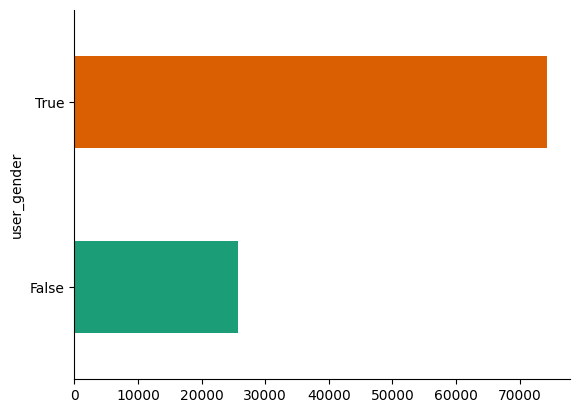

In [ ]:
# @title user_gender

from matplotlib import pyplot as plt
import seaborn as sns
ratings_df.groupby('user_gender').size().plot(kind='barh', color=sns.palettes.mpl_palette('Dark2'))
plt.gca().spines[['top', 'right',]].set_visible(False)

### Top 20 Most Rated Movies

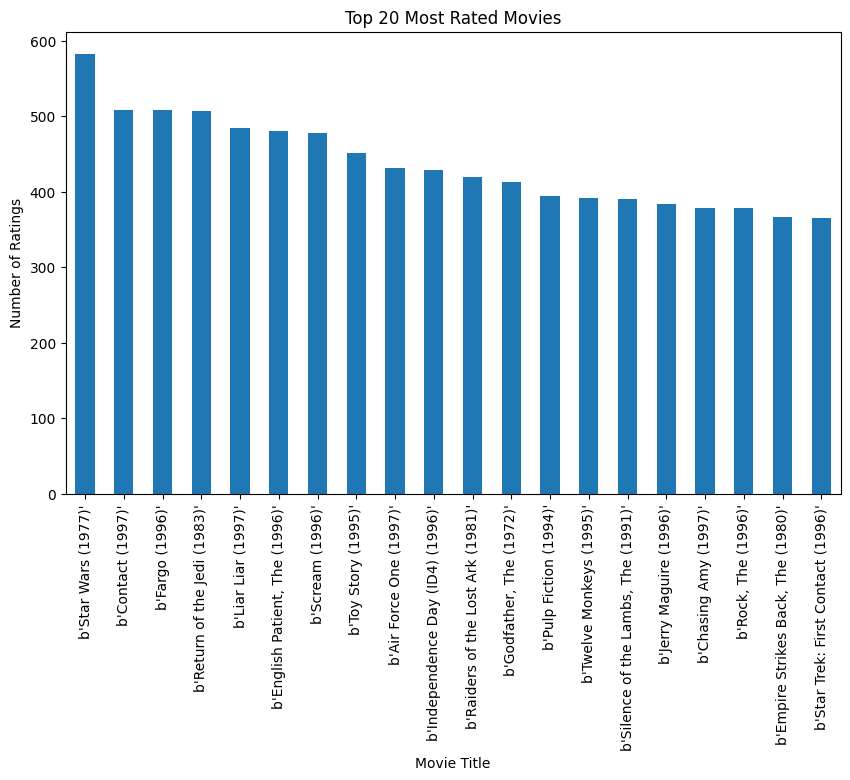

In [ ]:
# Plot histogram of movie ratings
plt.figure(figsize=(10, 6))
ratings_df['movie_title'].value_counts().head(20).plot(kind='bar')
plt.title('Top 20 Most Rated Movies')
plt.xlabel('Movie Title')
plt.ylabel('Number of Ratings')
plt.show()

### Overall Distribution of Movie Ratings

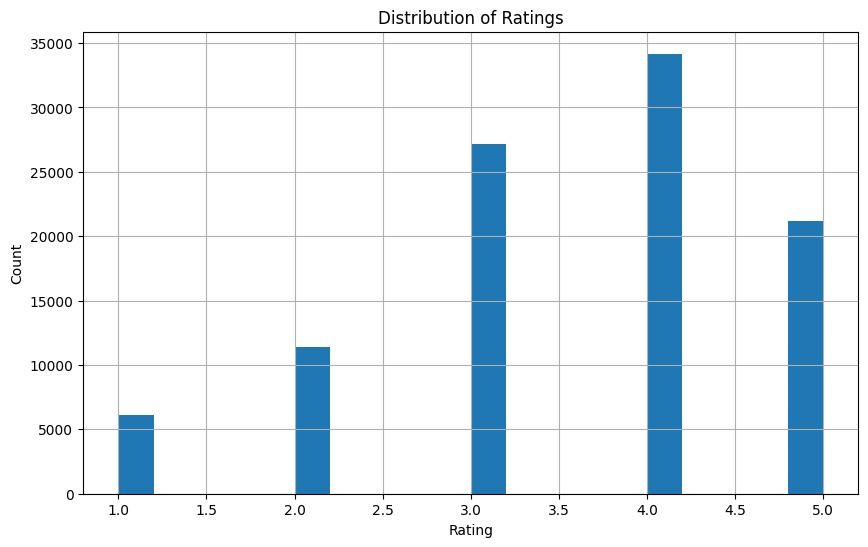

In [ ]:
# Plot histogram of ratings distribution
plt.figure(figsize=(10, 6))
ratings_df['user_rating'].hist(bins=20)
plt.title('Distribution of Ratings')
plt.xlabel('Rating')
plt.ylabel('Count')
plt.show()

# Mathematical Imputation and Deriving of a Seperate Attribute

### Calculating Score based on ' Weighted Average ' on User Ratings and Rating Counts

In [5]:
# Calculate average rating and number of ratings per movie
movie_ratings_summary = ratings_df.groupby('movie_title').agg({
    'user_rating': ['mean', 'count']
}).reset_index()

movie_ratings_summary.columns = ['movie_title', 'average_rating', 'rating_count']

# Define a score formula (e.g., weighted average)
movie_ratings_summary['score'] = (
    0.5 * movie_ratings_summary['average_rating'] +
    0.5 * movie_ratings_summary['rating_count'] / movie_ratings_summary['rating_count'].max()
)

# Merge the score back to the movies dataframe
movies_df = movies_df.merge(movie_ratings_summary[['movie_title', 'score']], on='movie_title', how='left')


In [6]:
movies_df[['movie_title', 'score']].head()

,movie_title,score
0,b'You So Crazy (1994)',1.500858
1,b'Love Is All There Is (1996)',1.500858
2,b'Fly Away Home (1996)',1.954374
3,b'In the Line of Duty 2 (1987)',1.378431
4,"b'Niagara, Niagara (1997)'",1.000858


### Restructuring the Table ( Pivoting to Weighted Average Scores )

In [7]:
# Create a pivot table of movie scores for each user
user_movie_scores = ratings_df.pivot_table(index='user_id', columns='movie_title', values='user_rating')

# Compute the correlation matrix
correlation_matrix = user_movie_scores.corr(method='pearson', min_periods=5)

In [8]:
correlation_matrix.head()

movie_title,"b""'Til There Was You (1997)""",b'1-900 (1994)',b'101 Dalmatians (1996)',b'12 Angry Men (1957)',b'187 (1997)',b'2 Days in the Valley (1996)',"b'20,000 Leagues Under the Sea (1954)'",b'2001: A Space Odyssey (1968)',b'3 Ninjas: High Noon At Mega Mountain (1998)',"b'39 Steps, The (1935)'",...,b'Yankee Zulu (1994)',b'Year of the Horse (1997)',b'You So Crazy (1994)',b'Young Frankenstein (1974)',b'Young Guns (1988)',b'Young Guns II (1990)',"b""Young Poisoner's Handbook, The (1995)""",b'Zeus and Roxanne (1997)',b'unknown',b'\xc3\x81 k\xc3\xb6ldum klaka (Cold Fever) (1994)'
movie_title,,,,,,,,,,,,,,,,,,,,,
"b""'Til There Was You (1997)""",1.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
b'1-900 (1994)',NaN,1.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
b'101 Dalmatians (1996)',NaN,NaN,1.000000,-0.049890,0.269191,0.048973,0.266928,-0.043407,NaN,0.111111,...,NaN,NaN,NaN,0.158840,0.119234,0.680414,6.500800e-17,0.707107,NaN,NaN
b'12 Angry Men (1957)',NaN,NaN,-0.049890,1.000000,0.666667,0.256625,0.274772,0.178848,NaN,0.457176,...,NaN,NaN,NaN,0.096546,0.068944,-0.361961,1.443376e-01,NaN,NaN,NaN
b'187 (1997)',NaN,NaN,0.269191,0.666667,1.000000,0.596644,NaN,-0.554700,NaN,NaN,...,NaN,NaN,NaN,0.455233,NaN,NaN,4.753271e-01,NaN,NaN,NaN


# Graph Convulational Neural Network along with K- Nearest Neighbors

## Constructon of a graph ( with nodes as movie titles and edges as Similarity Score )

**Edges are constructed between 2 nodes if the Pearson Similarity score is greater than 0.5**

In [9]:
import networkx as nx

# Ensure movie IDs are included in the movies dataframe
movies_df['movie_id'] = movies_df.index

# Create a graph
G = nx.Graph()

# Add nodes with movie IDs
for idx, row in movies_df.iterrows():
    G.add_node(row['movie_id'], title=row['movie_title'])

# Add edges with correlation scores above a threshold
threshold = 0.5
for i in range(len(correlation_matrix)):
    for j in range(i + 1, len(correlation_matrix)):
        if correlation_matrix.iloc[i, j] > threshold:
            G.add_edge(movies_df[movies_df['movie_title'] == correlation_matrix.columns[i]]['movie_id'].values[0],
                       movies_df[movies_df['movie_title'] == correlation_matrix.columns[j]]['movie_id'].values[0],
                       weight=correlation_matrix.iloc[i, j])


## Visualisation of the thus created Graph

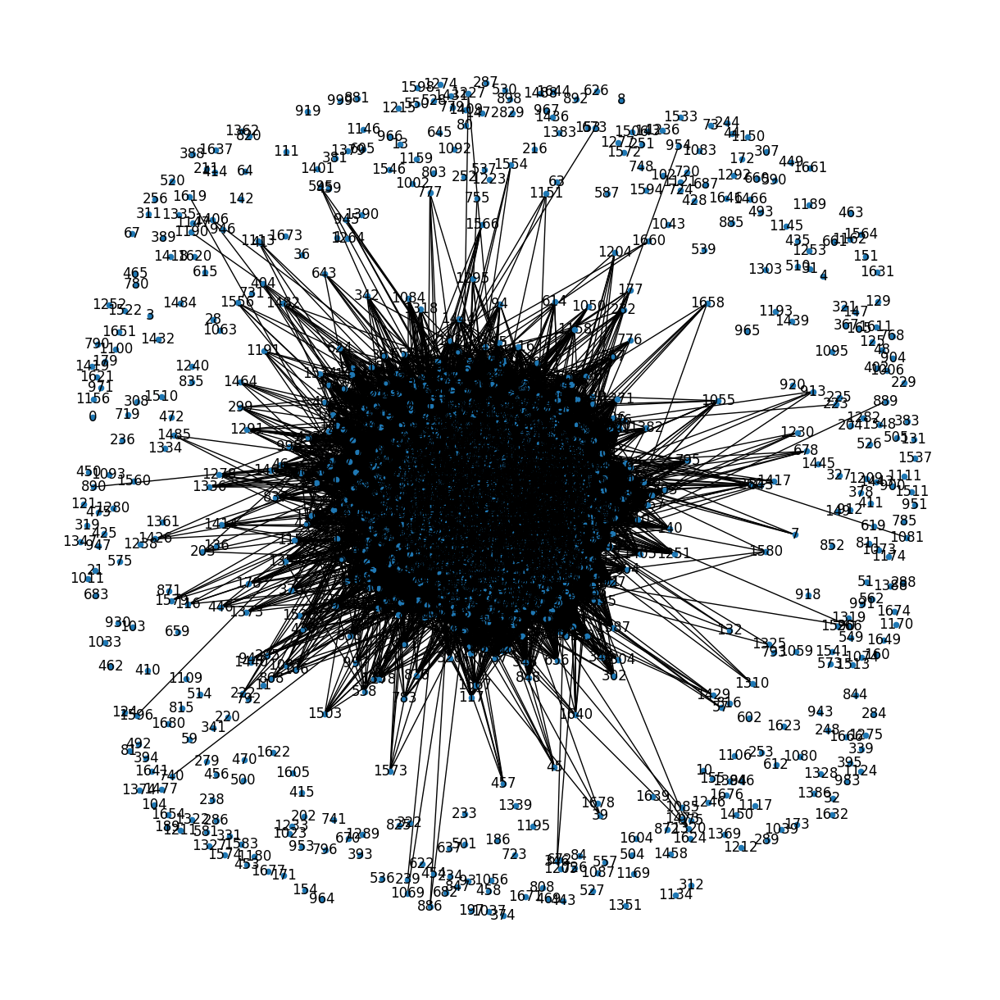

In [ ]:
# Visualize the graph
plt.figure(figsize=(12, 12))
pos = nx.spring_layout(G, k=0.15, iterations=20)
nx.draw(G, pos, node_size=20, with_labels=True, labels={node: node for node in G.nodes()})
plt.show()

In [ ]:
!pip install plotly

In [10]:
!pip3 install torch torchvision torchaudio --index-url https://download.pytorch.org/whl/cu121

Looking in indexes: https://download.pytorch.org/whl/cu121
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 23.7/23.7 MB 62.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 823.6/823.6 kB 61.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 14.1/14.1 MB 88.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 731.7/731.7 MB 1.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 410.6/410.6 MB 1.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 121.6/121.6 MB 8.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.5/56.5 MB 11.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 124.2/124.2 MB 9.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 196.0/196.0 MB 4.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 176.2/176.2 MB 7.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 99.1/99.1 kB 16.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━

## Checking if CUDA and Tensorflow utlizing GPU

In [11]:
import torch

# Check if CUDA is available
cuda_available = torch.cuda.is_available()
print("CUDA available:", cuda_available)

if cuda_available:
    # Print the number of GPUs available
    num_gpus = torch.cuda.device_count()
    print("Number of GPUs available:", num_gpus)

    # Print the name of the GPU being used
    for i in range(num_gpus):
        print(f"GPU {i} name:", torch.cuda.get_device_name(i))

    # Perform a simple tensor operation on the GPU
    x = torch.rand(3, 3).cuda()
    y = torch.rand(3, 3).cuda()
    z = x + y
    print("Tensor operation result:", z)
else:
    print("CUDA is not available. Ensure that the CUDA toolkit and NVIDIA drivers are properly installed.")


CUDA available: True
Number of GPUs available: 1
GPU 0 name: Tesla T4
Tensor operation result: tensor([[0.8980, 0.5630, 0.4056],
        [1.3132, 1.1943, 1.4626],
        [0.7856, 1.0308, 1.3131]], device='cuda:0')


In [12]:
!nvcc --version

nvcc: NVIDIA (R) Cuda compiler driver
Copyright (c) 2005-2023 NVIDIA Corporation
Built on Tue_Aug_15_22:02:13_PDT_2023
Cuda compilation tools, release 12.2, V12.2.140
Build cuda_12.2.r12.2/compiler.33191640_0


# Dynamic Graph Convulational Neural Network

In [13]:
import numpy as np
import pandas as pd
import networkx as nx
import matplotlib.pyplot as plt
import torch
import torch.nn as nn
import torch.optim as optim
from sklearn.neighbors import NearestNeighbors

In [14]:
# Define the DGCNN model
class DGCNN(nn.Module):
    def __init__(self, input_dim, hidden_dim, output_dim):
        super(DGCNN, self).__init__()
        self.conv1 = nn.Conv1d(input_dim, hidden_dim, kernel_size=1)
        self.conv2 = nn.Conv1d(hidden_dim, output_dim, kernel_size=1)

    def forward(self, x, adj):
        x = torch.relu(self.conv1(x))
        x = torch.relu(self.conv2(x))
        return x


### Adjaceny Matrix and Feature Matrix

In [15]:
# Prepare the adjacency matrix and feature matrix
adjacency_matrix = nx.adjacency_matrix(G).todense()
feature_matrix = np.eye(len(G.nodes))  # Identity matrix as initial features

# Convert to torch tensors
adjacency_matrix = torch.tensor(adjacency_matrix, dtype=torch.float32)
feature_matrix = torch.tensor(feature_matrix, dtype=torch.float32)


### Initaialising the Model, Loss Function and Optimiser

In [16]:
# Define the model, loss function, and optimizer
input_dim = feature_matrix.shape[1]
hidden_dim = 64
output_dim = 32
model = DGCNN(input_dim, hidden_dim, output_dim)
criterion = nn.MSELoss()
optimizer = optim.Adam(model.parameters(), lr=0.01)

In [18]:
print(f"Feature matrix shape: {feature_matrix.shape}")
print(f"Adjacency matrix shape: {adjacency_matrix.shape}")

model.train()
optimizer.zero_grad()
output = model(feature_matrix, adjacency_matrix)
print(f"Model output shape: {output.shape}")

Feature matrix shape: torch.Size([1682, 1682])
Adjacency matrix shape: torch.Size([1682, 1682])
Model output shape: torch.Size([32, 1682])


### Training the DGCNN Model for 500 Epochs

In [22]:
# Assuming the target should be reduced to match the model output shape
target = feature_matrix[:32, :]  # Adjust this line based on your model and dataset specifics

# Train the model
epochs = 500
for epoch in range(epochs):
    model.train()
    optimizer.zero_grad()
    output = model(feature_matrix, adjacency_matrix)
    loss = criterion(output, target)  # Use adjusted target for training
    loss.backward()
    optimizer.step()
    print(f'Epoch {epoch+1}/{epochs}, Loss: {loss.item()}')


Epoch 1/500, Loss: 0.0005695992731489241
Epoch 2/500, Loss: 0.0005684673087671399
Epoch 3/500, Loss: 0.0005663048941642046
Epoch 4/500, Loss: 0.0005639147129841149
Epoch 5/500, Loss: 0.0005612101522274315
Epoch 6/500, Loss: 0.0005578724085353315
Epoch 7/500, Loss: 0.0005537542747333646
Epoch 8/500, Loss: 0.000548804469872266
Epoch 9/500, Loss: 0.0005428730510175228
Epoch 10/500, Loss: 0.000536102510523051
Epoch 11/500, Loss: 0.0005287712556309998
Epoch 12/500, Loss: 0.0005204248591326177
Epoch 13/500, Loss: 0.0005111219943501055
Epoch 14/500, Loss: 0.000501739326864481
Epoch 15/500, Loss: 0.0004923158558085561
Epoch 16/500, Loss: 0.0004817807348445058
Epoch 17/500, Loss: 0.0004712302179541439
Epoch 18/500, Loss: 0.00046082644257694483
Epoch 19/500, Loss: 0.00045040357508696616
Epoch 20/500, Loss: 0.00044012899161316454
Epoch 21/500, Loss: 0.00043001447920687497
Epoch 22/500, Loss: 0.0004202918498776853
Epoch 23/500, Loss: 0.0004108082503080368
Epoch 24/500, Loss: 0.00040118026663549244

### Verification of Embeddings

In [23]:
# Extract embeddings
model.eval()
with torch.no_grad():
    embeddings = model(feature_matrix, adjacency_matrix).numpy()



In [27]:
embeddings

array([[0., 0., 0., ..., 0., 0., 0.],
       [0., 1., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       ...,
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.]], dtype=float32)

In [29]:
# Assuming feature_matrix and adjacency_matrix are already defined
print(f'Feature matrix shape: {feature_matrix.shape}')  # Should be (1682, num_features)
print(f'Adjacency matrix shape: {adjacency_matrix.shape}')  # Should be (1682, 1682)

Feature matrix shape: torch.Size([1682, 1682])
Adjacency matrix shape: torch.Size([1682, 1682])


### Leveraging Multiple GCN Layers inside DGCNN

In [31]:
Gimport torch
import torch.nn as nn
import torch.nn.functional as F

class GCNLayer(nn.Module):
    def __init__(self, in_features, out_features):
        super(GCNLayer, self).__init__()
        self.linear = nn.Linear(in_features, out_features)

    def forward(self, x, adj):
        support = self.linear(x)
        output = torch.spmm(adj, support)
        return output

In [32]:
class GCN(nn.Module):
    def __init__(self, in_features, hidden_dim, out_features):
        super(GCN, self).__init__()
        self.gc1 = GCNLayer(in_features, hidden_dim)
        self.gc2 = GCNLayer(hidden_dim, out_features)

    def forward(self, x, adj):
        x = F.relu(self.gc1(x, adj))
        x = self.gc2(x, adj)
        return x

# Instantiate the model with appropriate dimensions
model = GCN(in_features=feature_matrix.shape[1], hidden_dim=64, out_features=32)

# Move model to GPU if available
if torch.cuda.is_available():
    model = model.cuda()
    feature_matrix = feature_matrix.cuda()
    adjacency_matrix = adjacency_matrix.cuda()

# Generate embeddings for all movies
model.eval()  # Set model to evaluation mode
with torch.no_grad():
    embeddings = model(feature_matrix, adjacency_matrix)

# Convert embeddings to numpy array if needed
embeddings = embeddings.cpu().numpy() if torch.cuda.is_available() else embeddings.numpy()

# Ensure embeddings shape is correct
print(f'Embeddings shape: {embeddings.shape}')  # Should be (1682, 32)


Embeddings shape: (1682, 32)


### Recommendation of Similar Movies using K- Nearest Neighbors

In [33]:
from sklearn.neighbors import NearestNeighbors

# Use KNN for movie recommendations
knn = NearestNeighbors(n_neighbors=5, metric='cosine')
knn.fit(embeddings)

# Recommend movies
def recommend_movies(movie_title, k=5):
    movie_id = movies_df[movies_df['movie_title'] == movie_title]['movie_id'].values[0]
    distances, indices = knn.kneighbors([embeddings[movie_id]], n_neighbors=k+1)
    recommended_movie_ids = indices[0][1:]
    recommended_movies = movies_df[movies_df['movie_id'].isin(recommended_movie_ids)]['movie_title'].values
    return recommended_movies

# Example usage
print(recommend_movies(b'101 Dalmatians (1996)'))

[b'Mr. Smith Goes to Washington (1939)' b'In & Out (1997)'
 b'Dirty Dancing (1987)' b'Reality Bites (1994)'
 b'Grumpier Old Men (1995)']


### Utilisation of Dynamic GCN Layers inside DGCNN

In [34]:
import torch
import torch.nn as nn
import torch.nn.functional as F

class DynamicGCNLayer(nn.Module):
    def __init__(self, in_features, out_features):
        super(DynamicGCNLayer, self).__init__()
        self.linear = nn.Linear(in_features, out_features)

    def forward(self, x, adj):
        # Update adjacency matrix dynamically (for example, by computing similarities)
        adj = self.update_adj(x)
        support = self.linear(x)
        output = torch.spmm(adj, support)
        return output

    def update_adj(self, x):
        # Define a way to update the adjacency matrix
        # Here, we simply use the cosine similarity between nodes as an example
        cosine_similarity = F.cosine_similarity(x.unsqueeze(1), x.unsqueeze(0), dim=2)
        return cosine_similarity

In [36]:
import torch
import torch.nn as nn
import torch.nn.functional as F

class DynamicGCNLayer(nn.Module):
    def __init__(self, in_features, out_features):
        super(DynamicGCNLayer, self).__init__()
        self.linear = nn.Linear(in_features, out_features)

    def forward(self, x, adj):
        # Compute adjacency matrix in mini-batches to reduce memory usage
        batch_size = 256  # Adjust this value based on available memory
        num_nodes = x.size(0)
        cosine_similarity = torch.zeros((num_nodes, num_nodes), device=x.device)

        for i in range(0, num_nodes, batch_size):
            end_i = min(i + batch_size, num_nodes)
            for j in range(0, num_nodes, batch_size):
                end_j = min(j + batch_size, num_nodes)
                cosine_similarity[i:end_i, j:end_j] = F.cosine_similarity(x[i:end_i].unsqueeze(1), x[j:end_j].unsqueeze(0), dim=2)

        adj = cosine_similarity
        support = self.linear(x)
        output = torch.spmm(adj, support)
        return output

class DGCNN(nn.Module):
    def __init__(self, in_features, hidden_dim, out_features):
        super(DGCNN, self).__init__()
        self.gc1 = DynamicGCNLayer(in_features, hidden_dim)
        self.gc2 = DynamicGCNLayer(hidden_dim, out_features)

    def forward(self, x, adj):
        x = F.relu(self.gc1(x, adj))
        x = self.gc2(x, adj)
        return x

In [37]:
# Instantiate the model with appropriate dimensions
model = DGCNN(in_features=feature_matrix.shape[1], hidden_dim=64, out_features=32)

# Move model to GPU if available
if torch.cuda.is_available():
    model = model.cuda()
    feature_matrix = feature_matrix.cuda()
    adjacency_matrix = adjacency_matrix.cuda()

# Generate embeddings for all movies
model.eval()  # Set model to evaluation mode
with torch.no_grad():
    embeddings = model(feature_matrix, adjacency_matrix)

# Convert embeddings to numpy array if needed
embeddings = embeddings.cpu().numpy() if torch.cuda.is_available() else embeddings.numpy()

# Ensure embeddings shape is correct
print(f'Embeddings shape: {embeddings.shape}')  # Should be (1682, 32)

Embeddings shape: (1682, 32)


### Recommendation using K- Nearest Neightbors

In [38]:
from sklearn.neighbors import NearestNeighbors

# Use KNN for movie recommendations
knn = NearestNeighbors(n_neighbors=5, metric='cosine')
knn.fit(embeddings)

# Recommend movies
def recommend_movies(movie_title, k=5):
    movie_id = movies_df[movies_df['movie_title'] == movie_title]['movie_id'].values[0]
    distances, indices = knn.kneighbors([embeddings[movie_id]], n_neighbors=k+1)
    recommended_movie_ids = indices[0][1:]
    recommended_movies = movies_df[movies_df['movie_id'].isin(recommended_movie_ids)]['movie_title'].values
    return recommended_movies

# Example usage
print(recommend_movies(b'101 Dalmatians (1996)'))

[b'Careful (1992)' b'Scarlet Letter, The (1926)'
 b"I Don't Want to Talk About It (De eso no se habla) (1993)"
 b'Across the Sea of Time (1995)' b'Brassed Off (1996)']


# Exploratory Analysis Post- Modelling

## 2 Dimensional Principal Component Analysis for each movie

In [52]:
# Decode byte strings in movie titles
movies_df['movie_title'] = movies_df['movie_title'].apply(lambda x: x.decode('utf-8') if isinstance(x, bytes) else x)

# Create a DataFrame for Plotly with decoded movie titles
embeddings_df = pd.DataFrame(embeddings_2d, columns=['PC1', 'PC2'])
embeddings_df['movie_title'] = movies_df['movie_title'].values

# Plot embeddings
fig = px.scatter(embeddings_df, x='PC1', y='PC2', hover_data=['movie_title'],
                 title='2D PCA Visualization of Movie Embeddings')
fig.show()


## Graph Representation of Movie Similarities with Edge Trace

In [39]:
import plotly.graph_objects as go
import networkx as nx

# Create a NetworkX graph from the adjacency matrix
graph = nx.from_numpy_array(adjacency_matrix.cpu().numpy() if torch.cuda.is_available() else adjacency_matrix.numpy())

# Get node positions using a layout algorithm
pos = nx.spring_layout(graph)

# Extract node positions
x_nodes = [pos[i][0] for i in range(len(graph.nodes))]
y_nodes = [pos[i][1] for i in range(len(graph.nodes))]

# Extract edge positions
x_edges = []
y_edges = []
for edge in graph.edges():
    x_edges += [pos[edge[0]][0], pos[edge[1]][0], None]
    y_edges += [pos[edge[0]][1], pos[edge[1]][1], None]

# Create edge trace
edge_trace = go.Scatter(
    x=x_edges, y=y_edges,
    line=dict(width=1, color='rgba(0,0,0,0.2)'),
    hoverinfo='none',
    mode='lines')

# Create node trace
node_trace = go.Scatter(
    x=x_nodes, y=y_nodes,
    mode='markers',
    hoverinfo='text',
    marker=dict(
        showscale=True,
        colorscale='YlGnBu',
        size=10,
        color=[],
        colorbar=dict(
            thickness=15,
            title='Node Connections',
            xanchor='left',
            titleside='right'
        ),
        line_width=2))

# Add node titles
node_adjacencies = []
node_text = []
for node, adjacencies in enumerate(graph.adjacency()):
    node_adjacencies.append(len(adjacencies[1]))
    node_text.append(f'Movie ID: {node}<br># of connections: {len(adjacencies[1])}')
node_trace.marker.color = node_adjacencies
node_trace.text = node_text

# Create figure
fig = go.Figure(data=[edge_trace, node_trace],
                layout=go.Layout(
                    title='<br>Graph Representation of Movie Similarities',
                    titlefont_size=16,
                    showlegend=False,
                    hovermode='closest',
                    margin=dict(b=20,l=5,r=5,t=40),
                    annotations=[dict(
                        text="Graph structure with movie nodes and similarity edges",
                        showarrow=False,
                        xref="paper", yref="paper",
                        x=0.005, y=-0.002 )],
                    xaxis=dict(showgrid=False, zeroline=False),
                    yaxis=dict(showgrid=False, zeroline=False)))

fig.show()


## Degree Distribution of Movies

In [42]:
degree_sequence = [d for n, d in graph.degree()]
fig = px.histogram(degree_sequence, nbins=50, title='Degree Distribution of Movies in the Graph')
fig.update_layout(xaxis_title='Degree', yaxis_title='Count')
fig.show()

## Distribution of Node Centrality

In [43]:
centrality = nx.degree_centrality(graph)
centrality_values = list(centrality.values())

fig = px.histogram(centrality_values, nbins=50, title='Node Centrality Distribution')
fig.update_layout(xaxis_title='Centrality', yaxis_title='Count')
fig.show()


## Distribution of Clustering Coefficient (based on Similarity Score)

In [44]:
clustering_coefficient = nx.clustering(graph)
clustering_values = list(clustering_coefficient.values())

fig = px.histogram(clustering_values, nbins=50, title='Clustering Coefficient Distribution')
fig.update_layout(xaxis_title='Clustering Coefficient', yaxis_title='Count')
fig.show()

## Distribution of Shortest Path Between 2 Movie Nodes

In [45]:
path_lengths = dict(nx.shortest_path_length(graph))
lengths = [length for target_lengths in path_lengths.values() for length in target_lengths.values()]

fig = px.histogram(lengths, nbins=50, title='Shortest Path Length Distribution')
fig.update_layout(xaxis_title='Path Length', yaxis_title='Count')
fig.show()


## Distribution of Overall Edge Weights across graph

In [46]:
weights = [d['weight'] for (u, v, d) in graph.edges(data=True)]

fig = px.histogram(weights, nbins=50, title='Edge Weight (Similarity Score) Distribution')
fig.update_layout(xaxis_title='Weight', yaxis_title='Count')
fig.show()